# GAN (generative adversarial network)

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as func

import torchvision as vision
import torchvision.transforms as transforms

import matplotlib.pyplot as plt

from tqdm import tqdm_notebook as tqdm

from sklearn.manifold import TSNE

from torch.autograd import Variable

import numpy as np

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [10]:
import os
import zipfile

# Предположим, что вы находитесь в корневой папке проекта, где лежит zip-файл.
data_root = '.'  # корневая папка проекта
data_folder = os.path.join(data_root, 'img_align_celeba')
download_path = os.path.join(data_root, 'img_align_celeba.zip')

# Создадим папку, куда будем распаковывать, если ее нет
if not os.path.exists(data_folder):
    os.makedirs(data_folder)

# Распаковка архива
with zipfile.ZipFile(download_path, 'r') as ziphandler:
    ziphandler.extractall(data_folder)

print("Распаковка завершена.")


Распаковка завершена.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24966007..0.99998367].


202599


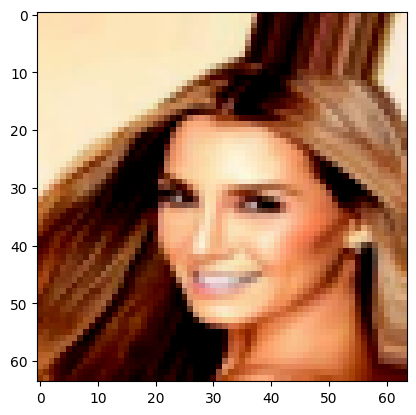

In [13]:
import os
from PIL import Image
from natsort import natsorted

img_size = 64
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Resize((img_size, img_size)),
     transforms.CenterCrop(img_size),
     transforms.Normalize((0.2), (0.8))
    ])

class CoolCelebaDataset(torch.utils.data.Dataset):
    def __init__(self):
        root_dir = f'{data_folder}/img_align_celeba'
        image_names = os.listdir(root_dir)
        self.root_dir = root_dir
        self.transform = transform
        self.image_names = natsorted(image_names)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.image_names[idx])
        img = Image.open(img_path).convert('RGB')  
        img = self.transform(img)
        return img
    
    def __len__(self):
        return len(self.image_names)
        
cool_celeba_dataset = CoolCelebaDataset()
print(len(cool_celeba_dataset))
plt.imshow(cool_celeba_dataset[0].permute(1, 2, 0))

In [14]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            # N * channels_img * 64 * 64
            nn.Conv2d(in_channels=channels_img,
                               out_channels=features_d,
                               kernel_size=4, 
                               stride=2,
                               padding=1),
            nn.LeakyReLU(0.2),
            # N * features_d * 32 * 32
            nn.Conv2d(in_channels=features_d,
                      out_channels=features_d * 2,
                      kernel_size=4,
                      stride=2,
                      padding=1),
            nn.BatchNorm2d(features_d * 2),
            nn.LeakyReLU(0.2),
            # N * (features_d * 2) * 16 * 16
            nn.Conv2d(in_channels=features_d * 2,
                      out_channels=features_d * 4,
                      kernel_size=4,
                      stride=2,
                      padding=1),
            nn.BatchNorm2d(features_d * 4),
            nn.LeakyReLU(0.2),
            # N * (features_d * 4) * 8 * 8
            nn.Conv2d(in_channels=features_d * 4,
                      out_channels=features_d * 8,
                      kernel_size=4,
                      stride=2,
                      padding=1),
            nn.BatchNorm2d(features_d * 8),
            nn.LeakyReLU(0.2),
            # N * (features_d * 8) * 4 * 4
            nn.Conv2d(in_channels=features_d * 8,
                      out_channels=1,
                      kernel_size=4,
                      stride=2,
                      padding=0),       
            # N * 1 * 1 * 1
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.net(input)

In [15]:
class Generator(nn.Module):
    def __init__(self, channels_noise, channels_img, featured_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # N * channels_noise * 1 * 1
            nn.ConvTranspose2d(in_channels=channels_noise,
                               out_channels=featured_g * 8,
                               kernel_size=4, 
                               stride=1,
                               padding=0),
            nn.BatchNorm2d(featured_g * 8),
            nn.ReLU(),
            # N * (featured_g * 16) * 4 * 4
            nn.ConvTranspose2d(in_channels=featured_g * 8,
                               out_channels=featured_g * 4,
                               kernel_size=4, 
                               stride=2,
                               padding=1),
            nn.BatchNorm2d(featured_g * 4),
            nn.ReLU(),
            # N * (featured_g * 8) * 8 * 8
            nn.ConvTranspose2d(in_channels=featured_g * 4,
                               out_channels=featured_g * 2,
                               kernel_size=4, 
                               stride=2,
                               padding=1),
            nn.BatchNorm2d(featured_g * 2),
            nn.ReLU(),
            # N * (featured_g * 4) * 16 * 16
            nn.ConvTranspose2d(in_channels=featured_g * 2,
                               out_channels=featured_g,
                               kernel_size=4, 
                               stride=2,
                               padding=1),
            nn.BatchNorm2d(featured_g),
            nn.ReLU(),
            # N * (featured_g * 2) * 32 * 32
            nn.ConvTranspose2d(in_channels=featured_g,
                               out_channels=channels_img,
                               kernel_size=4, 
                               stride=2,
                               padding=1),
            nn.Tanh()
            # N * channels_img  * 64 * 64
        )

    def forward(self, input):
        return self.net(input)

In [16]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(m.weight, 1.0, 0.02)
        torch.nn.init.zeros_(m.bias)

In [17]:
from tqdm import tqdm

In [18]:
import torchvision.utils as vutils

lr = 0.0002
batch_size = 1000
image_size = 64
channels_img = 3
channels_noise = 100
num_epochs = 20

features_d = 64
features_g = 64

dataloader = torch.utils.data.DataLoader(cool_celeba_dataset, 
                                         batch_size=batch_size, shuffle=True)

netD = Discriminator(channels_img, features_d).to(device)
netD.apply(weights_init)
netG = Generator(channels_noise, channels_img, features_g).to(device)
netG.apply(weights_init)

optimizerD =  torch.optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerG =  torch.optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))

criterion = nn.BCELoss()

real_label = 1
fake_label = 0

fixed_noise = torch.randn(64, channels_noise, 1, 1).to(device)

img_list = []

# Training Loop
print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(tqdm(dataloader, desc=f'epoch {epoch}')):
        data = data.to(device)
        batch_size = data.shape[0]

        ############################
        # (1) Train Discriminator: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        netD.zero_grad()
        label = torch.full((batch_size,), real_label,
                           dtype=data.dtype, device=device)
        output = netD(data).reshape(-1)
        lossD_real = criterion(output, label)
        lossD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(batch_size, channels_noise, 1, 1).to(device)
        fake = netG(noise)
        label.fill_(fake_label)

        output = netD(fake.detach()).reshape(-1)
        lossD_fake = criterion(output, label)
        lossD_fake.backward()

        lossD = lossD_real + lossD_fake
        optimizerD.step()

        ############################
        # (2) Train Generator: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake).reshape(-1)
        lossG = criterion(output, label)
        lossG.backward()
        optimizerG.step()

        # Output training stats
        if i != 0 and i % 100 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f'
                  % (epoch + 1, num_epochs, i, len(dataloader),
                     lossD, lossG, D_x))
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

Starting Training Loop...


epoch 0:  50%|████▉     | 101/203 [01:18<01:25,  1.19it/s]

[1/20][100/203]	Loss_D: 1.0779	Loss_G: 5.7242	D(x): 0.7605


epoch 0:  99%|█████████▉| 201/203 [02:33<00:01,  1.23it/s]

[1/20][200/203]	Loss_D: 0.9810	Loss_G: 3.2111	D(x): 0.6515


epoch 1:  50%|████▉     | 101/203 [01:20<01:55,  1.13s/it]

[2/20][100/203]	Loss_D: 0.9652	Loss_G: 1.8934	D(x): 0.5339


epoch 1:  99%|█████████▉| 201/203 [02:48<00:01,  1.05it/s]

[2/20][200/203]	Loss_D: 0.9533	Loss_G: 2.7600	D(x): 0.6918


epoch 2:  50%|████▉     | 101/203 [01:31<01:58,  1.16s/it]

[3/20][100/203]	Loss_D: 0.7895	Loss_G: 1.8304	D(x): 0.6074


epoch 2:  99%|█████████▉| 201/203 [03:00<00:02,  1.15s/it]

[3/20][200/203]	Loss_D: 0.9593	Loss_G: 2.8566	D(x): 0.7113


epoch 3:  50%|████▉     | 101/203 [01:25<01:23,  1.23it/s]

[4/20][100/203]	Loss_D: 1.0733	Loss_G: 1.2393	D(x): 0.4633


epoch 3:  99%|█████████▉| 201/203 [02:58<00:02,  1.13s/it]

[4/20][200/203]	Loss_D: 1.0024	Loss_G: 3.2586	D(x): 0.7893


epoch 4:  50%|████▉     | 101/203 [01:31<01:33,  1.09it/s]

[5/20][100/203]	Loss_D: 1.1793	Loss_G: 1.2011	D(x): 0.4304


epoch 4:  99%|█████████▉| 201/203 [02:55<00:02,  1.09s/it]

[5/20][200/203]	Loss_D: 0.9809	Loss_G: 2.5517	D(x): 0.7299


epoch 5:  50%|████▉     | 101/203 [01:30<01:51,  1.09s/it]

[6/20][100/203]	Loss_D: 0.9509	Loss_G: 2.8056	D(x): 0.7708


epoch 5:  99%|█████████▉| 201/203 [03:00<00:02,  1.11s/it]

[6/20][200/203]	Loss_D: 0.7756	Loss_G: 2.1069	D(x): 0.6531


epoch 6:  50%|████▉     | 101/203 [01:28<01:29,  1.14it/s]

[7/20][100/203]	Loss_D: 0.8051	Loss_G: 1.6776	D(x): 0.6012


epoch 6:  99%|█████████▉| 201/203 [02:54<00:01,  1.01it/s]

[7/20][200/203]	Loss_D: 0.6856	Loss_G: 2.1159	D(x): 0.7234


epoch 7:  50%|████▉     | 101/203 [01:26<01:49,  1.08s/it]

[8/20][100/203]	Loss_D: 0.7627	Loss_G: 1.6224	D(x): 0.6468


epoch 7:  99%|█████████▉| 201/203 [02:47<00:02,  1.03s/it]

[8/20][200/203]	Loss_D: 0.8796	Loss_G: 2.7686	D(x): 0.8867


epoch 8:  50%|████▉     | 101/203 [01:30<01:53,  1.11s/it]

[9/20][100/203]	Loss_D: 0.7754	Loss_G: 2.4256	D(x): 0.7359


epoch 8:  99%|█████████▉| 201/203 [02:58<00:02,  1.07s/it]

[9/20][200/203]	Loss_D: 1.4464	Loss_G: 3.8956	D(x): 0.9046


epoch 9:  50%|████▉     | 101/203 [01:29<01:48,  1.06s/it]

[10/20][100/203]	Loss_D: 0.8069	Loss_G: 2.4100	D(x): 0.7209


epoch 9:  99%|█████████▉| 201/203 [02:50<00:01,  1.15it/s]

[10/20][200/203]	Loss_D: 1.0570	Loss_G: 0.8795	D(x): 0.4310


epoch 10:  50%|████▉     | 101/203 [01:29<01:49,  1.07s/it]

[11/20][100/203]	Loss_D: 0.6965	Loss_G: 1.9361	D(x): 0.7335


epoch 10:  99%|█████████▉| 201/203 [02:55<00:01,  1.04it/s]

[11/20][200/203]	Loss_D: 0.9017	Loss_G: 2.0414	D(x): 0.7064


epoch 11:  50%|████▉     | 101/203 [01:26<01:49,  1.08s/it]

[12/20][100/203]	Loss_D: 0.8252	Loss_G: 1.8444	D(x): 0.6793


epoch 11:  99%|█████████▉| 201/203 [02:54<00:02,  1.08s/it]

[12/20][200/203]	Loss_D: 1.1957	Loss_G: 0.8556	D(x): 0.3754


epoch 12:  50%|████▉     | 101/203 [01:29<01:49,  1.08s/it]

[13/20][100/203]	Loss_D: 0.9820	Loss_G: 1.3415	D(x): 0.5787


epoch 12:  99%|█████████▉| 201/203 [02:57<00:02,  1.08s/it]

[13/20][200/203]	Loss_D: 0.8873	Loss_G: 2.2165	D(x): 0.8316


epoch 13:  50%|████▉     | 101/203 [01:29<01:49,  1.08s/it]

[14/20][100/203]	Loss_D: 1.3984	Loss_G: 0.3224	D(x): 0.3174


epoch 13:  99%|█████████▉| 201/203 [02:58<00:02,  1.07s/it]

[14/20][200/203]	Loss_D: 1.0655	Loss_G: 0.9440	D(x): 0.4182


epoch 14:  50%|████▉     | 101/203 [01:29<01:49,  1.07s/it]

[15/20][100/203]	Loss_D: 0.8103	Loss_G: 1.4368	D(x): 0.6308


epoch 14:  99%|█████████▉| 201/203 [02:57<00:02,  1.07s/it]

[15/20][200/203]	Loss_D: 1.0491	Loss_G: 2.8403	D(x): 0.8544


epoch 15:  50%|████▉     | 101/203 [01:30<01:50,  1.08s/it]

[16/20][100/203]	Loss_D: 1.8544	Loss_G: 3.5952	D(x): 0.9462


epoch 15:  99%|█████████▉| 201/203 [02:59<00:02,  1.08s/it]

[16/20][200/203]	Loss_D: 1.0013	Loss_G: 1.1341	D(x): 0.4503


epoch 16:  50%|████▉     | 101/203 [01:29<01:50,  1.08s/it]

[17/20][100/203]	Loss_D: 0.8056	Loss_G: 1.7985	D(x): 0.7566


epoch 16:  99%|█████████▉| 201/203 [02:59<00:02,  1.08s/it]

[17/20][200/203]	Loss_D: 1.6800	Loss_G: 0.2369	D(x): 0.2330


epoch 17:  50%|████▉     | 101/203 [01:29<01:51,  1.10s/it]

[18/20][100/203]	Loss_D: 0.8419	Loss_G: 1.2704	D(x): 0.5792


epoch 17:  99%|█████████▉| 201/203 [02:59<00:02,  1.07s/it]

[18/20][200/203]	Loss_D: 0.8391	Loss_G: 1.2669	D(x): 0.6230


epoch 18:  50%|████▉     | 101/203 [01:24<01:25,  1.20it/s]

[19/20][100/203]	Loss_D: 0.8445	Loss_G: 1.6306	D(x): 0.6738


epoch 18:  99%|█████████▉| 201/203 [02:51<00:02,  1.08s/it]

[19/20][200/203]	Loss_D: 0.7474	Loss_G: 1.6802	D(x): 0.7033


epoch 19:  50%|████▉     | 101/203 [01:27<01:30,  1.13it/s]

[20/20][100/203]	Loss_D: 0.8390	Loss_G: 1.1096	D(x): 0.5847


epoch 19:  99%|█████████▉| 201/203 [02:55<00:02,  1.07s/it]

[20/20][200/203]	Loss_D: 1.1186	Loss_G: 0.8523	D(x): 0.4230


epoch 19: 100%|██████████| 203/203 [02:56<00:00,  1.15it/s]


Animation size has reached 11098034 bytes, exceeding the limit of 10485760.0. If you're sure you want a larger animation embedded, set the animation.embed_limit rc parameter to a larger value (in MB). This and further frames will be dropped.


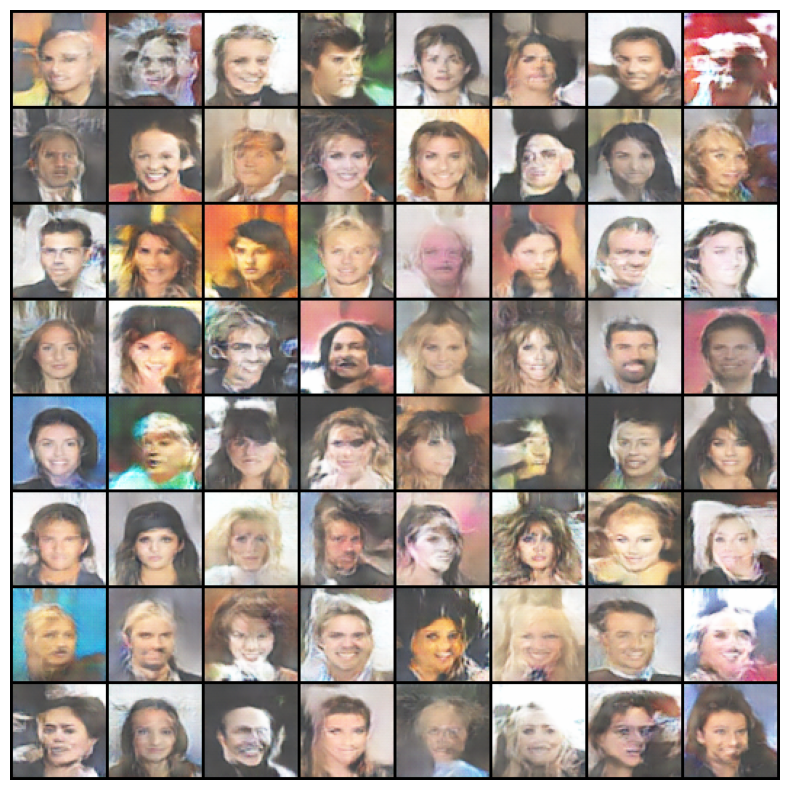

In [21]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import matplotlib

fig = plt.figure(figsize=(10,10))
plt.axis("off")
matplotlib.rcParams['animation.embed_limit'] = 2*5
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())